# Mental Health Clustering

### Read data set and display information

In [1]:
# Import some required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# read data set

df_health = pd.read_csv('mental-illnesses-prevalence.csv')
df_health.head()

,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815


In [3]:
# rename columns

df_health = df_health.rename(columns={'Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized': 'Schizophrenia', 
                          'Depressive disorders (share of population) - Sex: Both - Age: Age-standardized': 'Depressive',
                         'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized':'Anxiety',
                         'Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized':'Bipolar',
                         'Eating disorders (share of population) - Sex: Both - Age: Age-standardized':'Eating'})

In [4]:
# get shape of data set and new name for columns

print(df_health.shape)
print(df_health.columns)

(6420, 8)
Index(['Entity', 'Code', 'Year', 'Schizophrenia', 'Depressive', 'Anxiety',
       'Bipolar', 'Eating'],
      dtype='object')


In [5]:
# show general informations

df_health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6420 entries, 0 to 6419
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Entity         6420 non-null   object 
 1   Code           6150 non-null   object 
 2   Year           6420 non-null   int64  
 3   Schizophrenia  6420 non-null   float64
 4   Depressive     6420 non-null   float64
 5   Anxiety        6420 non-null   float64
 6   Bipolar        6420 non-null   float64
 7   Eating         6420 non-null   float64
dtypes: float64(5), int64(1), object(2)
memory usage: 401.4+ KB


In [6]:
# describe data set

df_health.describe()

,Year,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
count,6420.000000,6420.000000,6420.000000,6420.000000,6420.000000,6420.000000
mean,2004.500000,0.266604,3.767036,4.101840,0.636968,0.195664
std,8.656116,0.039383,0.925286,1.050543,0.233391,0.138380
min,1990.000000,0.188416,1.522333,1.879996,0.181667,0.044780
25%,1997.000000,0.242267,3.080036,3.425846,0.520872,0.096416
50%,2004.500000,0.273477,3.636772,3.939547,0.579331,0.144150
75%,2012.000000,0.286575,4.366252,4.564164,0.844406,0.251167
max,2019.000000,0.462045,7.645899,8.624634,1.506730,1.031688


In [7]:
# In this dataset, we only use 5 variables. Schizophrenia, Depressive, Anxiety, Bipolar and Eating

features = ['Schizophrenia', 'Depressive','Anxiety','Bipolar','Eating']
df_health[features]

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
0,0.223206,4.996118,4.713314,0.703023,0.127700
1,0.222454,4.989290,4.702100,0.702069,0.123256
2,0.221751,4.981346,4.683743,0.700792,0.118844
3,0.220987,4.976958,4.673549,0.700087,0.115089
4,0.220183,4.977782,4.670810,0.699898,0.111815
...,...,...,...,...,...
6415,0.201042,3.407624,3.184012,0.538596,0.095652
6416,0.201319,3.410755,3.187148,0.538593,0.096662
6417,0.201639,3.411965,3.188418,0.538589,0.097330
6418,0.201976,3.406929,3.172111,0.538585,0.097909


# Plotly visualizations

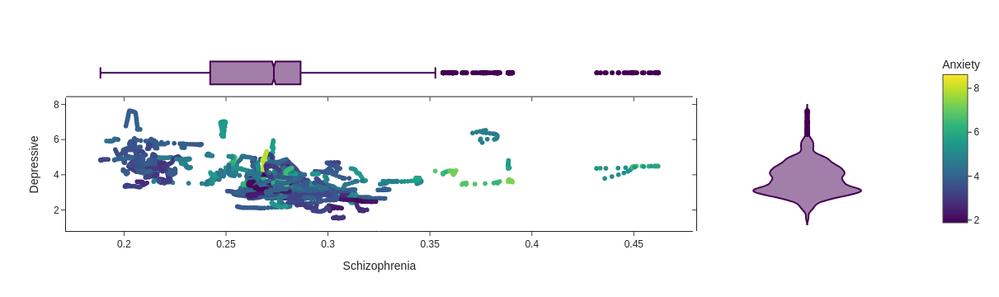

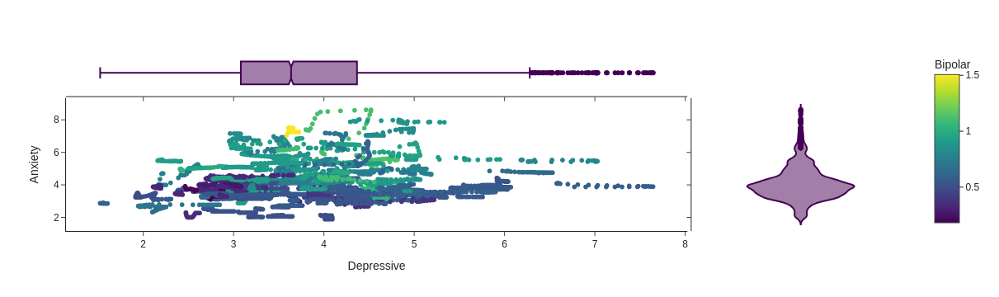

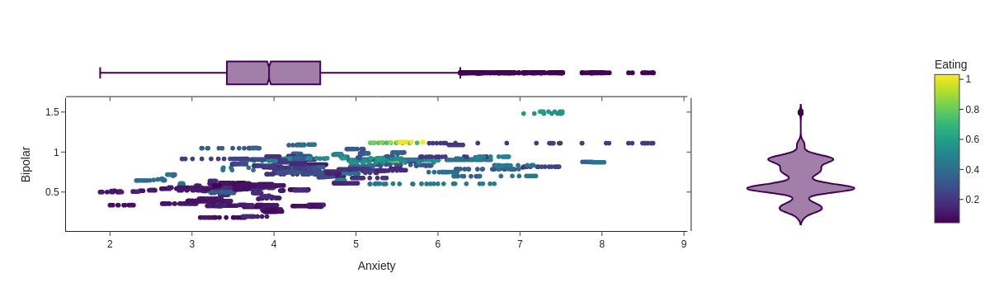

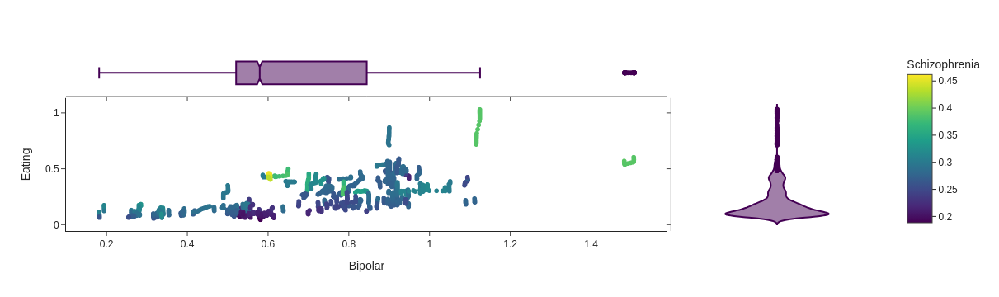

In [8]:

import plotly.express as px

fig1 = px.scatter(df_health, x="Schizophrenia", y="Depressive", color="Anxiety", marginal_y="violin",
           marginal_x="box", template="simple_white")
fig1.show()

fig2 = px.scatter(df_health, x="Depressive", y="Anxiety", color="Bipolar", marginal_y="violin",
           marginal_x="box", template="simple_white")
fig2.show()

fig3 = px.scatter(df_health, x="Anxiety", y="Bipolar", color="Eating", marginal_y="violin",
           marginal_x="box", template="simple_white")
fig3.show()

fig4 = px.scatter(df_health, x="Bipolar", y="Eating", color="Schizophrenia", marginal_y="violin",
           marginal_x="box", template="simple_white")
fig4.show()

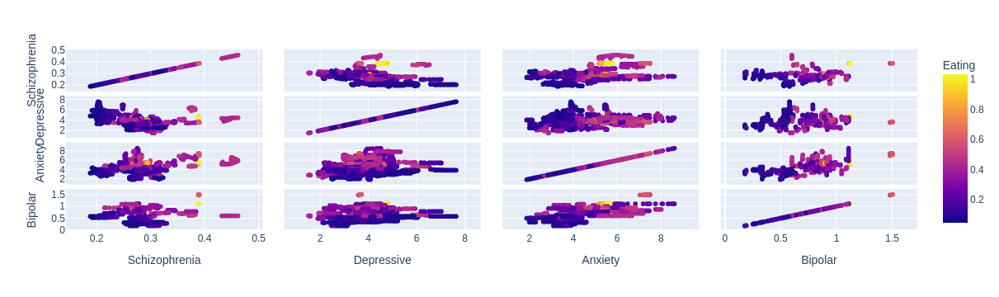

In [9]:
fig = px.scatter_matrix(data_frame=df_health, dimensions=["Schizophrenia", "Depressive", "Anxiety", "Bipolar"], color="Eating")
fig.show()

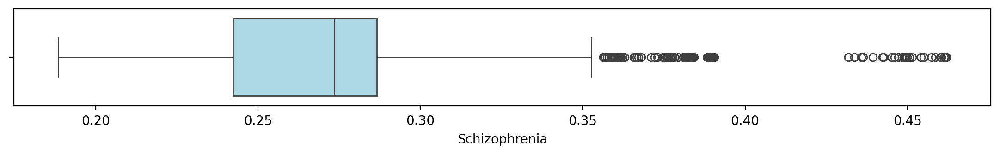

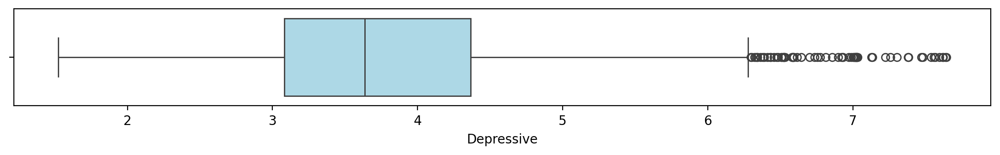

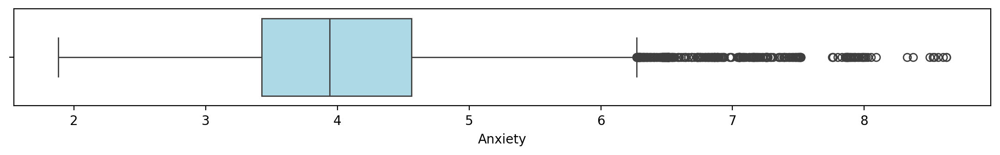

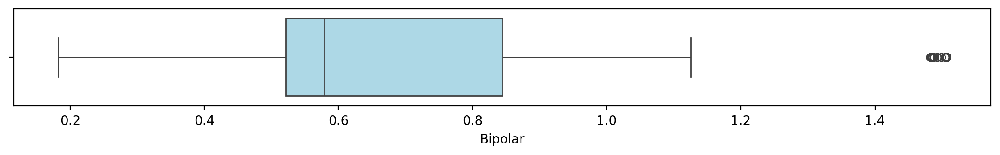

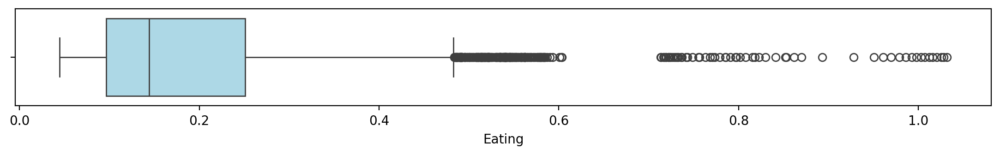

In [10]:
Numerical = ['Schizophrenia', 'Depressive','Anxiety','Bipolar','Eating']
i = 0
while i < 5:
    fig = plt.figure(figsize = [30,3], dpi=200)
    plt.subplot(2,2,1)
    sns.boxplot(x = Numerical[i], data = df_health, boxprops = dict(facecolor = "lightblue"))
    i += 1
    plt.show()

<Axes: >

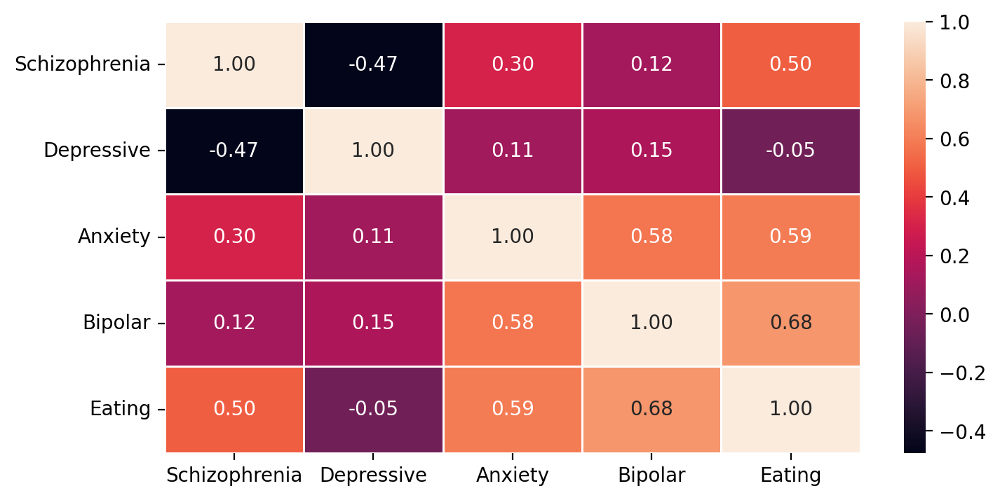

In [11]:
Corrmat = df_health[Numerical].corr()
plt.figure(figsize=(8, 4), dpi=200)
sns.heatmap(Corrmat, annot=True,fmt=".2f", linewidth=.5)

In [12]:
features

['Schizophrenia', 'Depressive', 'Anxiety', 'Bipolar', 'Eating']

# K-Means

In [13]:
# import library and make object

from sklearn.cluster import KMeans

kmeans_model = KMeans(init='k-means++', n_clusters=3, n_init=10,max_iter=300, random_state=42)
kmeans_model

KMeans(n_clusters=3, n_init=10, random_state=42)

In [14]:
# train k-means model

cluster_km = kmeans_model.fit(df_health[features])
cluster_km

KMeans(n_clusters=3, n_init=10, random_state=42)

In [15]:
# Inertia measures how well a dataset was clustered by K-Means. It is calculated by measuring the distance between each
# data point and its centroid, squaring this distance, and summing these squares across one cluster. 
#A good model is one with low inertia AND a low number of clusters ( K ).

cluster_km.inertia_

5264.336621759852

In [16]:
# The "cluster center" is the arithmetic mean of all the points belonging to the cluster. 
# Each point is closer to its own cluster center than to other cluster centers.

cluster_km.cluster_centers_

array([[0.23647181, 4.71686437, 3.85629856, 0.63624499, 0.15052616],
       [0.27844532, 3.09059344, 3.62023544, 0.53714676, 0.15449974],
       [0.292419  , 3.73637564, 5.80532637, 0.89614548, 0.38646993]])

In [17]:
# creat dict of kwargs for find inertia for each number of cluster

kmeans_kw = {
    "init": "k-means++",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

In [18]:
# In this section, calculate the amount of inertia for clusters from 1 to 9.
# we need this list for graph elbow point

iner = []
for k in range(1, 10):
    kmeans_model = KMeans(n_clusters=k, **kmeans_kw)
    kmeans_model.fit(df_health[features])
    iner.append(kmeans_model.inertia_)
    
iner

[13062.446880177522,
 8327.663448201421,
 5264.336621759852,
 4268.377246013358,
 3434.659169025017,
 2837.2133081139646,
 2488.845928569135,
 2209.2859080089274,
 2032.814531707654]

## Elbow Point

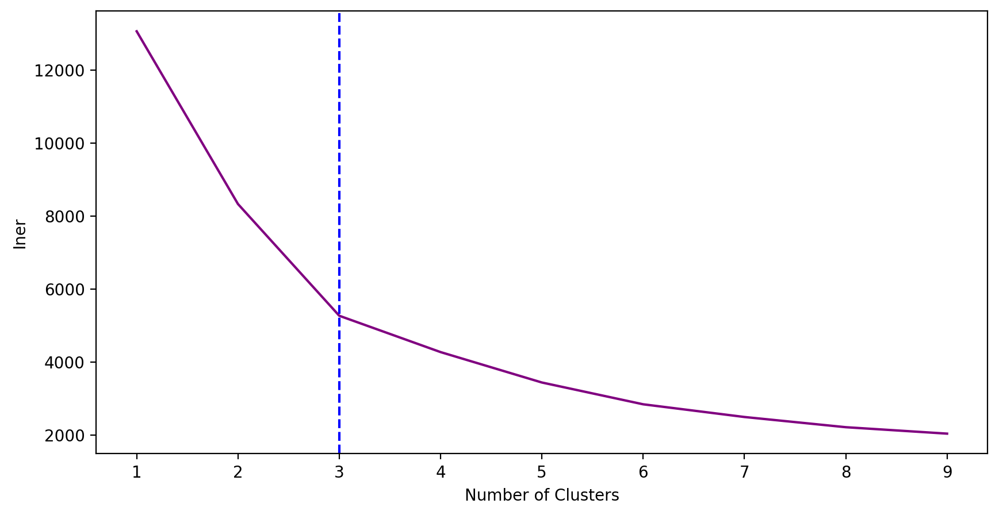

In [19]:
# This method is a visual technique used to determine the best K value for a k-means clustering algorithm. 
# In this method, a graph known as the elbow graph plots the within-cluster-sum-of-square (WCSS) values against 
# various K values. The optimal K value is identified at the point where the graph bends like an elbow.

plt.figure(figsize=(10,5), dpi=200)
plt.plot(range(1, 10), iner, color='purple')
plt.xticks(range(1, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Iner")
plt.axvline(x = 3, color = 'b', label = 'axvline - full height', linestyle="dashed")
plt.show()

In [20]:
from kneed import KneeLocator

KL = KneeLocator(range(1,10), iner, curve="convex", direction= "decreasing")
KL.elbow

3

## show quality of clustering

In [21]:
# The silhouette score is a metric used to evaluate the quality of clustering performed by K-means.
# It essentially measures how well data points are grouped within their assigned clusters compared 
# to data points in other clusters.

from sklearn.metrics import silhouette_score

silhouette_coefficients = []

for k in range(2, 11):
    
    kmeans_model = KMeans(n_clusters=k, **kmeans_kw)
    kmeans_model.fit(df_health[features])
    
    score = silhouette_score(df_health[features], kmeans_model.labels_)
    silhouette_coefficients.append(score)

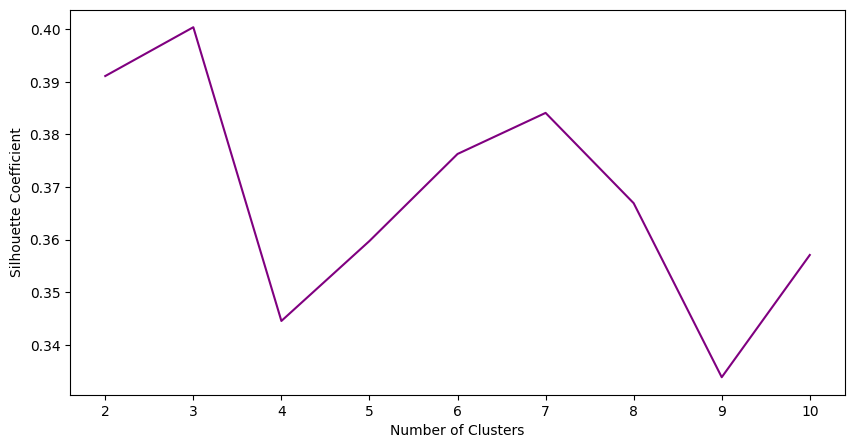

In [22]:


plt.figure(figsize=(10,5))
plt.plot(range(2, 11), silhouette_coefficients, color='purple')
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [23]:
# labels of clusters

kmeans = KMeans(n_clusters=3)
kmeans.fit(df_health[features])

labels_Km = kmeans.labels_
labels_Km

array([1, 1, 1, ..., 2, 2, 2], dtype=int32)

## Graph a Scatter Plot between features

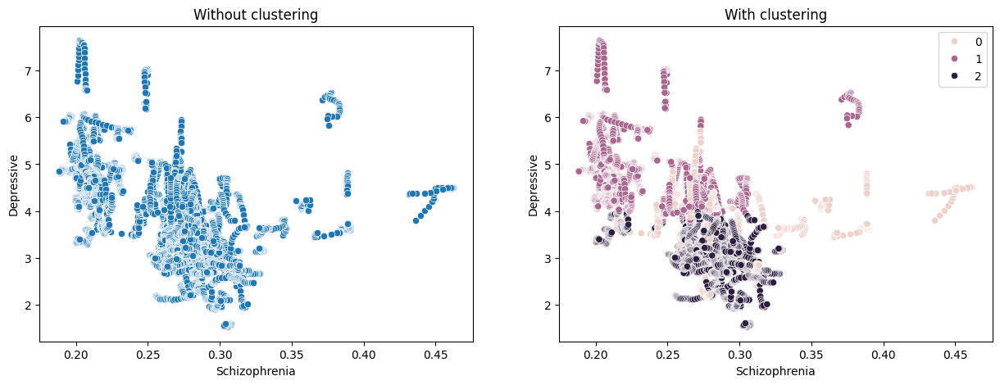

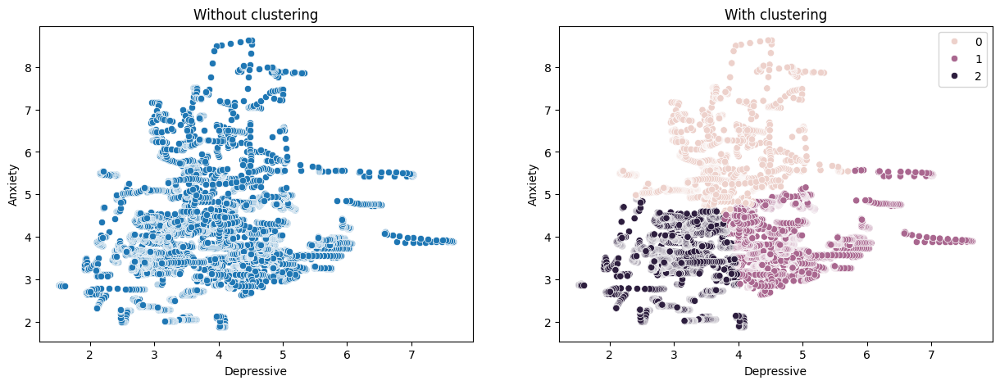

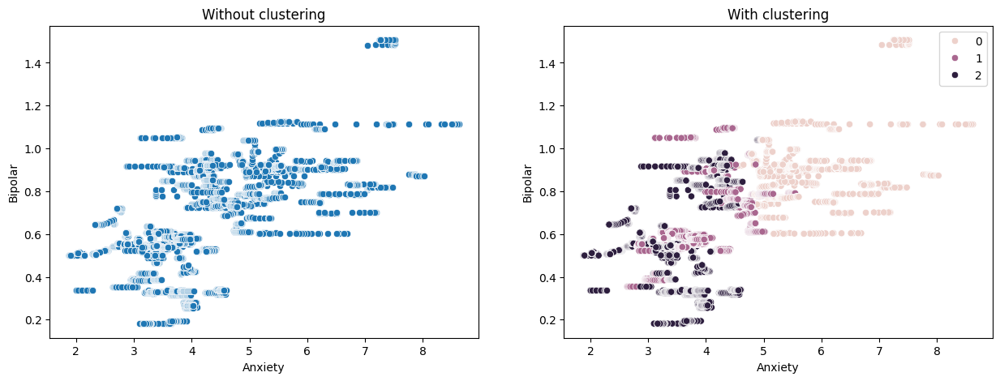

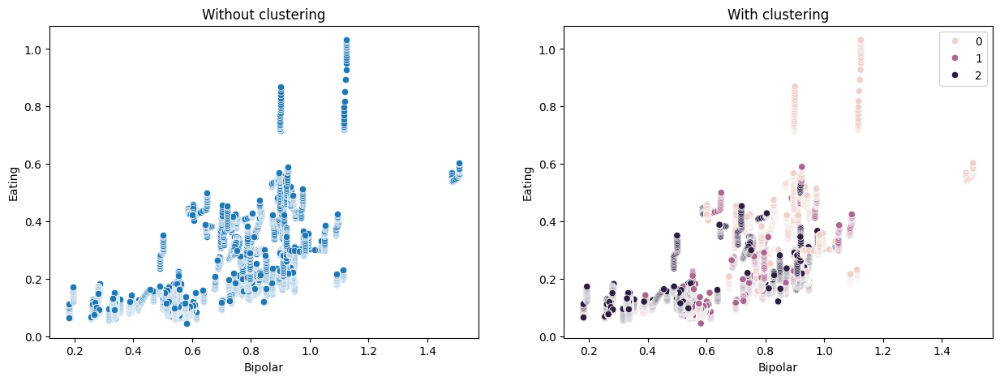

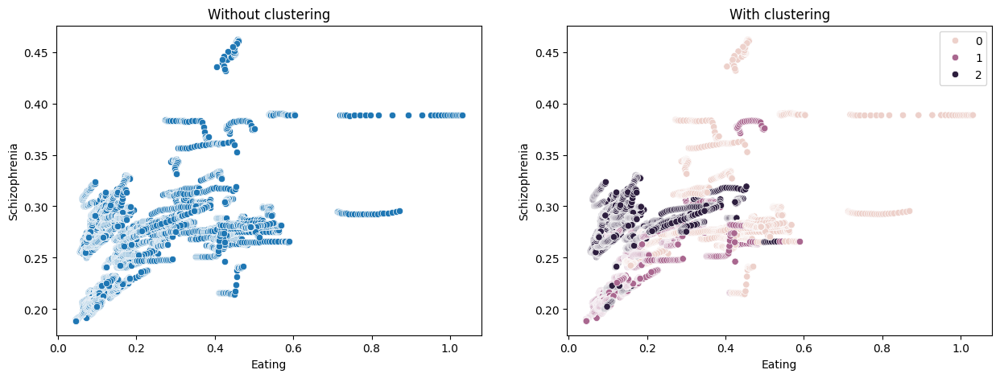

In [24]:
# draw the scatter plot between features twice, first without specifying the clusters and second with specifying the clusters

# Schizophrenia , Depressive
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Schizophrenia', y='Depressive').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Schizophrenia', y='Depressive', hue=labels_Km).set_title('With clustering');

# Depressive , Anxiety
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Depressive', y='Anxiety').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Depressive', y='Anxiety', hue=labels_Km).set_title('With clustering');

# Anxiety , Bipolar
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Anxiety', y='Bipolar').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Anxiety', y='Bipolar', hue=labels_Km).set_title('With clustering');

# Bipolar , Eating
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Bipolar', y='Eating').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Bipolar', y='Eating', hue=labels_Km).set_title('With clustering');

# Eating , Schizophrenia
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Eating', y='Schizophrenia').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Eating', y='Schizophrenia', hue=labels_Km).set_title('With clustering');

# Spectral Clustering

In [25]:
# Spectral Clustering is a type of clustering algorithm in machine learning that uses eigenvectors of a similarity matrix 
# to divide a set of data points into clusters.

from sklearn.cluster import SpectralClustering

In [31]:
# create model spectral clustering

spect_cluster_model = SpectralClustering(n_clusters=3, assign_labels='discretize', random_state=0)
spect_cluster_model

SpectralClustering(assign_labels='discretize', n_clusters=3, random_state=0)

In [32]:
# fit the model

spect_cluster_model.fit(df_health[features])

SpectralClustering(assign_labels='discretize', n_clusters=3, random_state=0)

In [33]:
label_SC = spect_cluster_model.labels_
set(spect_cluster_model.labels_)

{0, 1, 2}

In [ ]:
# draw the scatter plot between features twice, first without specifying the clusters and second with specifying the clusters

# Schizophrenia , Depressive
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Schizophrenia', y='Depressive').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Schizophrenia', y='Depressive', hue=label_SC).set_title('With clustering');

# Depressive , Anxiety
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Depressive', y='Anxiety').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Depressive', y='Anxiety', hue=label_SC).set_title('With clustering');

# Anxiety , Bipolar
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Anxiety', y='Bipolar').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Anxiety', y='Bipolar', hue=label_SC).set_title('With clustering');

# Bipolar , Eating
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Bipolar', y='Eating').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Bipolar', y='Eating', hue=label_SC).set_title('With clustering');

# Eating , Schizophrenia
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.scatterplot(ax=axes[0], data=df_health, x='Eating', y='Schizophrenia').set_title('Without clustering')
sns.scatterplot(ax=axes[1], data=df_health, x='Eating', 
                y='Schizophrenia', hue=label_SC).set_title('With clustering');
